# Deep Image Prior is a notebook based on Skoltech's Deep Learning course homework, which was created based on article:
https://arxiv.org/pdf/1711.10925.pdf

In [1]:
!pip install torchmetrics
import torch
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import torchvision
from torchvision import transforms
import gdown
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torchmetrics import TotalVariation as TV
import gc

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 761.3/761.3 kB 13.3 MB/s eta 0:00:00


In [2]:
class Encoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.downsample = torch.nn.MaxPool2d(2)
    def forward(self,x):
        int_out = self.model(x)
        return self.downsample(int_out), int_out

class Decoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
    def forward(self,x,enc_x):
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)

In [3]:
class Unet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block(hidden_size*16,hidden_size*8),
            Decoder_Block(hidden_size*8,hidden_size*4),
            Decoder_Block(hidden_size*4,hidden_size*2),
            Decoder_Block(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
sharing_link = "https://drive.google.com/file/d/1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU/view?usp=share_link"
gdown.download(url=sharing_link, output="./data.zip", quiet=False, fuzzy=True)
!unzip ./data.zip

Downloading...
From: https://drive.google.com/uc?id=1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU
To: /content/data.zip
100%|██████████| 1.60M/1.60M [00:00<00:00, 108MB/s]

Archive:  ./data.zip
   creating: data/
   creating: data/denoising/
  inflating: data/denoising/F16_GT.png  
  inflating: data/denoising/snail.jpg  
   creating: data/inpainting/
  inflating: data/inpainting/kate.png  
  inflating: data/inpainting/kate_mask.png  
  inflating: data/inpainting/library.png  
  inflating: data/inpainting/library_mask.png  
  inflating: data/inpainting/vase.png  
  inflating: data/inpainting/vase_mask.png  


In [6]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

In [7]:
img = transform(Image.open("./data/denoising/F16_GT.png"))[None].to(device)

In [8]:
noise_strength = 0.1
corrupted_img = (img + torch.randn_like(img)*noise_strength).clamp(0,1)

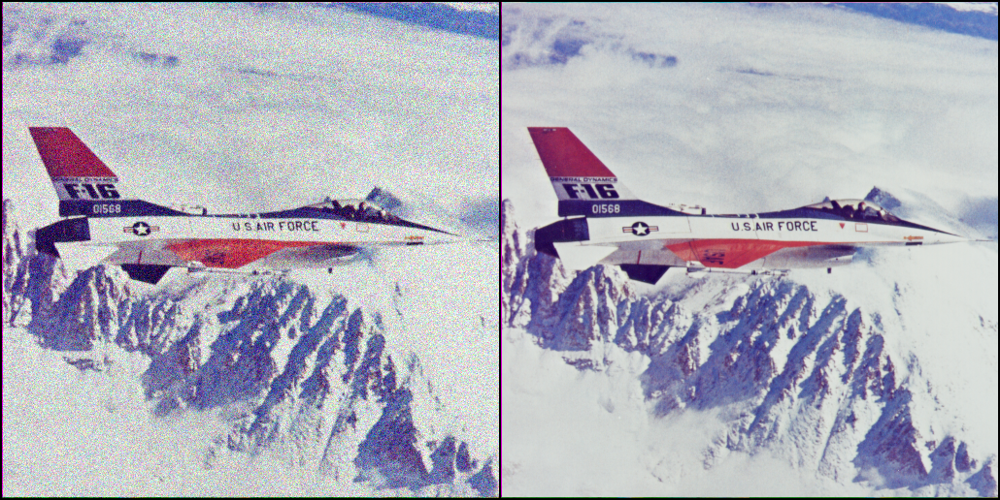

In [9]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

## Optimization (6 pts)

Task: Implement an optimization function that takes a model, input image, corrupted image, original image, and the number of iterations as arguments.

Steps:

1. Initialize an optimizer (Adam optimizer with learning rate $10^{-4}$).
2. Write a cycle for optimization using the specified loss function (criterion).
3. In each step of the cycle, add a certain amount of noise (reg_noise=0.01) to the input $z$ to ensure computational stability.

**We have provided baseline values for hyperparameters in this and future tasks, but feel free to make adjustments if needed.**

In [10]:
def optimization(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    opt = torch.optim.Adam(model.parameters(),lr=0.0001)
    loss_corrupted = []
    loss_orig = []
    model = model.cuda()
    model.train(True)
    z = z.cuda()
    orig_img = orig_img.cuda()
    corrupted_img = corrupted_img.cuda()
    for i in tqdm(range(iters)):
      m = (z+torch.rand_like(z)*reg_noise).clamp(0,1)
      output = model(m)


      loss = criterion(output, corrupted_img)
      loss_corrupted.append(loss.item())
      loss_orig.append(criterion(output, orig_img).item())
      opt.zero_grad()
      loss.backward()
      opt.step()
      if i%100 == 0 and i//100 > 1:
        print(f'Loss_orig: {loss_orig[i]},Loss_corrupted: {loss_corrupted[i]}')
    return loss_orig, loss_corrupted, output

### Run the optimization (6 pts):

1. Start by initializing the UNet model with 32 input channels, 3 output channels, and a hidden size of 16.
2. Create a model input of size (1, 32, img.size(2), img.size(3)) by sampling from a normal distribution with a mean of 0 and standard deviation of 0.1.
3. Train the model for 3000 iterations.
4. Plot the training convergence with the loss computed for both generated and corrupted images.
5. Plot the training convergence with the loss computed for both generated and original images.
6. Visualize the results, including the original image, the corrupted image, and the restored image.
7. Explain obtained results (**Hint: look closely at the plot from step 5**)

In [11]:
model = Unet(32,3,16)
mean, std = 0, 0.1
z = np.random.normal(loc=mean,scale=std,size=(1,32,img.shape[2],img.shape[3]))
input = torch.tensor(z,requires_grad=True,dtype=torch.float32)
print(input.shape)
print(f'Mean: {input.mean()}, Std: {input.std()}')
orig, corr,output = optimization(model=model,z=input,orig_img=img,corrupted_img=corrupted_img,iters=3000)



torch.Size([1, 32, 512, 512])
Mean: 1.5868894479353912e-05, Std: 0.1000160351395607


  7%|▋         | 202/3000 [00:23<03:35, 12.96it/s]

Loss_orig: 0.007293298840522766,Loss_corrupted: 0.016154024749994278


 10%|█         | 302/3000 [00:30<03:07, 14.40it/s]

Loss_orig: 0.003470249241217971,Loss_corrupted: 0.012262066826224327


 13%|█▎        | 402/3000 [00:37<03:06, 13.90it/s]

Loss_orig: 0.002238407265394926,Loss_corrupted: 0.010844143107533455


 17%|█▋        | 502/3000 [00:44<02:58, 14.01it/s]

Loss_orig: 0.0017642098246142268,Loss_corrupted: 0.010142653249204159


 20%|██        | 602/3000 [00:52<02:51, 13.97it/s]

Loss_orig: 0.0015827948227524757,Loss_corrupted: 0.009718403220176697


 23%|██▎       | 702/3000 [00:59<02:50, 13.49it/s]

Loss_orig: 0.001545320963487029,Loss_corrupted: 0.009402594529092312


 27%|██▋       | 802/3000 [01:06<02:37, 13.99it/s]

Loss_orig: 0.0015756429638713598,Loss_corrupted: 0.00912074651569128


 30%|███       | 902/3000 [01:13<02:30, 13.91it/s]

Loss_orig: 0.0016588149592280388,Loss_corrupted: 0.0088422242552042


 33%|███▎      | 1002/3000 [01:21<02:33, 12.98it/s]

Loss_orig: 0.0017814200837165117,Loss_corrupted: 0.00855894386768341


 37%|███▋      | 1102/3000 [01:28<02:16, 13.93it/s]

Loss_orig: 0.0019247187301516533,Loss_corrupted: 0.008282894268631935


 40%|████      | 1202/3000 [01:35<02:13, 13.47it/s]

Loss_orig: 0.0020813876762986183,Loss_corrupted: 0.008000521920621395


 43%|████▎     | 1302/3000 [01:43<02:04, 13.66it/s]

Loss_orig: 0.002246374962851405,Loss_corrupted: 0.007735466118901968


 47%|████▋     | 1402/3000 [01:50<01:55, 13.84it/s]

Loss_orig: 0.0024025249294936657,Loss_corrupted: 0.007486955728381872


 50%|█████     | 1502/3000 [01:57<01:49, 13.70it/s]

Loss_orig: 0.002581964712589979,Loss_corrupted: 0.007240897044539452


 53%|█████▎    | 1602/3000 [02:05<01:39, 13.98it/s]

Loss_orig: 0.0027321698144078255,Loss_corrupted: 0.0070319040678441525


 57%|█████▋    | 1702/3000 [02:12<01:31, 14.17it/s]

Loss_orig: 0.002883370965719223,Loss_corrupted: 0.006819411180913448


 60%|██████    | 1802/3000 [02:19<01:33, 12.82it/s]

Loss_orig: 0.0030192851554602385,Loss_corrupted: 0.006642128340899944


 63%|██████▎   | 1902/3000 [02:26<01:18, 13.90it/s]

Loss_orig: 0.003146362490952015,Loss_corrupted: 0.006460367701947689


 67%|██████▋   | 2002/3000 [02:34<01:11, 13.90it/s]

Loss_orig: 0.00328566855750978,Loss_corrupted: 0.006309028714895248


 70%|███████   | 2102/3000 [02:41<01:04, 13.97it/s]

Loss_orig: 0.003410761011764407,Loss_corrupted: 0.006171739660203457


 73%|███████▎  | 2202/3000 [02:48<00:57, 14.00it/s]

Loss_orig: 0.0035245525650680065,Loss_corrupted: 0.006034062709659338


 77%|███████▋  | 2302/3000 [02:56<00:50, 13.72it/s]

Loss_orig: 0.003636794164776802,Loss_corrupted: 0.005916673690080643


 80%|████████  | 2402/3000 [03:03<00:42, 14.04it/s]

Loss_orig: 0.0037235580384731293,Loss_corrupted: 0.005805527325719595


 83%|████████▎ | 2502/3000 [03:10<00:35, 13.89it/s]

Loss_orig: 0.003820237470790744,Loss_corrupted: 0.005707330070436001


 87%|████████▋ | 2602/3000 [03:17<00:30, 12.92it/s]

Loss_orig: 0.003925256431102753,Loss_corrupted: 0.005606037564575672


 90%|█████████ | 2702/3000 [03:25<00:21, 13.86it/s]

Loss_orig: 0.004020294174551964,Loss_corrupted: 0.0055203004740178585


 93%|█████████▎| 2802/3000 [03:32<00:14, 13.77it/s]

Loss_orig: 0.00408998504281044,Loss_corrupted: 0.0054368916898965836


 97%|█████████▋| 2902/3000 [03:39<00:07, 13.80it/s]

Loss_orig: 0.004158659838140011,Loss_corrupted: 0.005359861999750137


100%|██████████| 3000/3000 [03:46<00:00, 13.24it/s]


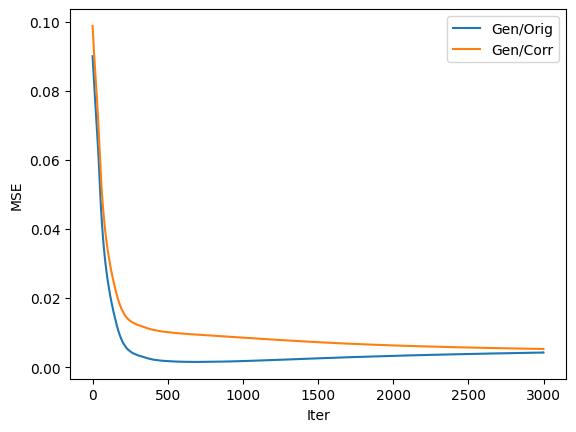

In [12]:
plt.plot(range(len(orig)),orig,label='Gen/Orig')
plt.plot(range(len(orig)),corr,label='Gen/Corr')
plt.ylabel('MSE')
plt.xlabel('Iter')
plt.legend()
plt.show()

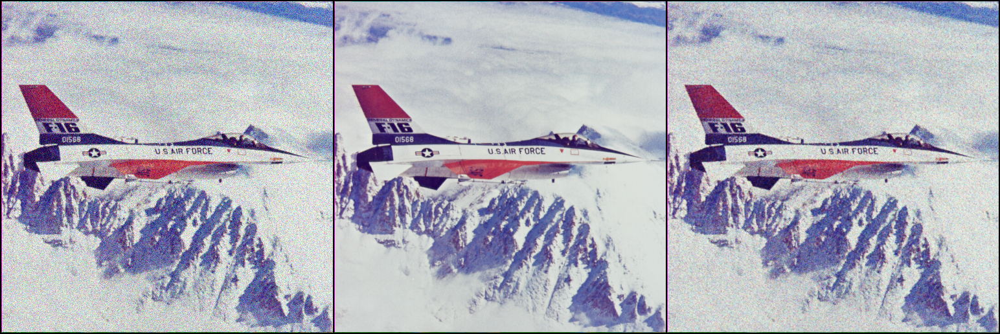

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,output],dim=0),nrow=3,normalize=True))

## Early stopping (3 pts)

One solution to prevent the recurrence of past issues is by terminating the training process at an optimal point. However, determining the ideal number of iterations can be a challenging task. Therefore, your objective is to:

1. Find out appropriate number of iterations (the best reconstruction of original image)
2. Suggest stopping criteria for the denoising task in real case (when you do not know ground truth) (**Hint: use Total Variation metric to measure the amount of noise in the image**)
3. Compare the result of your strategy with found number of iterations in the first step


From previous picture we see that MSE loss between generated picture and original has a minimum of a function somewhere before 1000 iters.

In [ ]:
# It's oprimization approch based on MSE between original picture and generated
def optimization_appropriate(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    opt = torch.optim.Adam(model.parameters(),lr=0.0001)
    loss_corrupted = [1000,1000]
    loss_orig = []
    output_prev = [0]*6 # to collect best output
    model = model.cuda()
    z = z.cuda()
    orig_img = orig_img.cuda()
    corrupted_img = corrupted_img.cuda()
    model.train(True)
    #stop function
    def stop_condition(iter,lst):
      return lst[iter]>lst[iter-1] and lst[iter]>lst[iter-2] and lst[iter]>lst[iter-3] and lst[iter]>lst[iter-4] and lst[iter]>lst[iter-5] and lst[iter]>lst[iter-6]

    for i in tqdm(range(iters)):

      m = (z+torch.rand_like(z)*reg_noise).clamp(0,1)
      output = model(m)


      loss = criterion(output, corrupted_img)
      loss_orig.append(criterion(output, orig_img).item())
      loss_corrupted.append(loss.item())
      #condition for early stopping
      if stop_condition(i,loss_orig):
        break


      opt.zero_grad()
      loss.backward()
      opt.step()
      output_prev.append(output)
      output_prev = output_prev[1:]


      if i%100 == 0 and i//100 > 1:
        print(f'Loss_orig: {loss_orig[i]},Loss_corrupted: {loss_corrupted[i]}')
    return loss_orig, loss_corrupted[2:], output_prev[0]


Mean: 4.5871605834690854e-05, Std: 0.09999161213636398


  7%|▋         | 203/3000 [00:15<03:24, 13.66it/s]

Loss_orig: 0.008381947875022888,Loss_corrupted: 0.017608996480703354


 10%|█         | 303/3000 [00:22<03:24, 13.22it/s]

Loss_orig: 0.0032801316119730473,Loss_corrupted: 0.0122752096503973


 13%|█▎        | 403/3000 [00:30<03:15, 13.26it/s]

Loss_orig: 0.001853962428867817,Loss_corrupted: 0.010644365102052689


 17%|█▋        | 503/3000 [00:38<03:08, 13.28it/s]

Loss_orig: 0.0014977464452385902,Loss_corrupted: 0.010048172436654568


 18%|█▊        | 544/3000 [00:41<03:06, 13.20it/s]


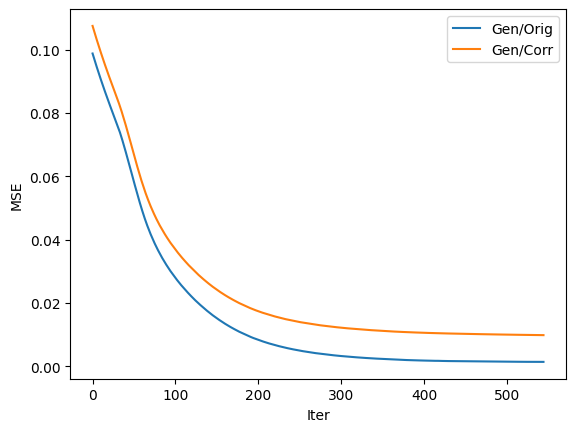

In [ ]:
model = Unet(32,3,16)
print(f'Mean: {input.mean()}, Std: {input.std()}')
orig_es, corr_es,output_es = optimization_appropriate(model=model,z=input,orig_img=img,corrupted_img=corrupted_img,iters=3000)
plt.plot(range(len(orig_es)),orig_es,label='Gen/Orig')
plt.plot(range(len(orig_es)),corr_es,label='Gen/Corr')
plt.ylabel('MSE')
plt.xlabel('Iter')
plt.legend()
plt.show()

In [ ]:
from torchmetrics import TotalVariation
def optimization_modified(model,z,noised_img,orig_img,iters,criterion=torch.nn.MSELoss()):
    opt = torch.optim.Adam(model.parameters(),lr=0.0001)
    loss_corrupted = []
    loss_orig = []
    output_prev = [0]*10
    TV_ar = [10000000]
    TV=TotalVariation().to('cuda')
    model = model.cuda()
    z = z.cuda()
    orig_img = orig_img.cuda()
    reg_noise = 0.01
    corrupted_img = noised_img.cuda()
    model.train(True)
    #stop function takes iter and lst of loss
    def check_condition(iter,lst):
      arr = np.array(lst[iter-10:])
      idx_min=np.argmin(arr)
      if idx_min==0 and len(lst)>20:
        return True
      return False

    for i in tqdm(range(iters)):
      m = (z+torch.rand_like(z)*reg_noise).clamp(0,1)
      output = model(m)


      loss = criterion(output, noised_img)
      TV_i = TV(output).item()
      TV_ar.append(TV_i)
      #condition for early stopping
      if check_condition(i, TV_ar[1:]):
        break

      output_prev.append(output)
      output_prev= output_prev[1:]
      loss_orig.append(criterion(output, orig_img).item())
      loss_corrupted.append(loss.item())
      opt.zero_grad()
      loss.backward()
      opt.step()
      if i%100 == 0 and i//100 > 1:
        print(f'Loss_orig: {loss_orig[i]},Loss_corrupted: {loss_corrupted[i]},TV: {TV_ar[i]}')

    return loss_orig, loss_corrupted, output_prev[0].clamp(0,1), TV_ar[1:]


  7%|▋         | 202/3000 [00:15<03:24, 13.68it/s]

Loss_orig: 0.005387767683714628,Loss_corrupted: 0.014207232743501663,TV: 57603.25


 10%|█         | 302/3000 [00:22<03:37, 12.40it/s]

Loss_orig: 0.002968794433400035,Loss_corrupted: 0.011651543900370598,TV: 48671.58203125


 13%|█▎        | 382/3000 [00:28<03:18, 13.21it/s]


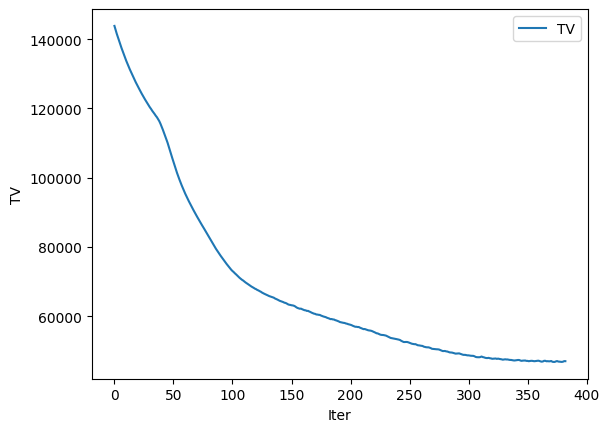

In [ ]:
model = Unet(32,3,16)
orig_TV, corr_TV,output_TV,TV_ar = optimization_modified(model=model,z=input,orig_img=img,noised_img=corrupted_img,iters=3000)
plt.plot(range(len(TV_ar)),TV_ar,label='TV')
plt.ylabel('TV')
plt.xlabel('Iter')
plt.legend()
plt.show()

In [ ]:
print(f'MSE Loss with early stopping TV {orig_TV[len(orig_TV)-10]}')
print(f'MSE Loss best {orig_es[len(orig_es)-5]}')

MSE Loss with early stopping TV 0.0022876730654388666
MSE Loss best 0.0014329960104078054


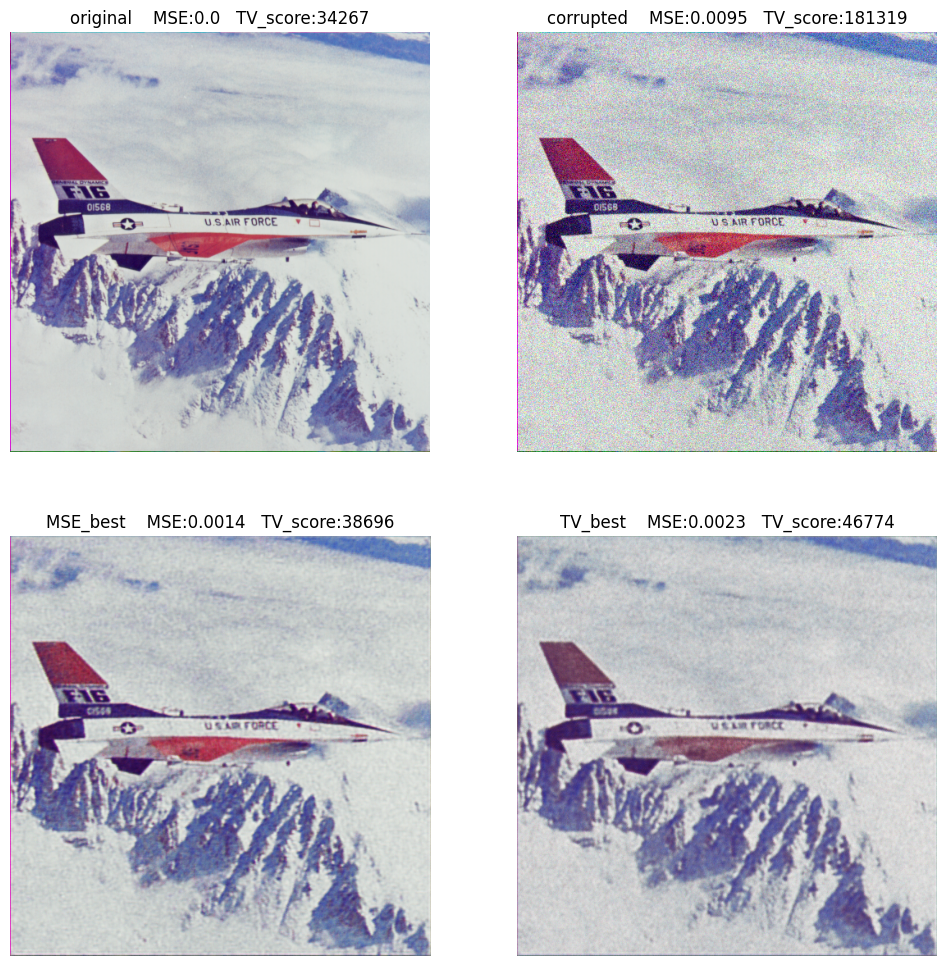

In [ ]:
MSE = torch.nn.MSELoss()
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,12))
TV= TotalVariation().to('cuda')
MSE = torch.nn.MSELoss().to('cuda')
output = [img,corrupted_img,output_es,output_TV]
labels = ['original','corrupted','MSE_best','TV_best']
for title,pic,ax in zip(labels,output,ax.flat):
  ax.imshow(pic[0].cpu().detach().numpy().transpose((1, 2, 0)))
  ax.set_title(f'{title}    MSE:{round(float(MSE(pic,img)),4)}   TV_score:{int(TV(pic))}')
  ax.set_axis_off()

## Stochastic gradient Langevin dynamics (SGLD) optimization

Another way to solve the problem of increasing the loss function over iterations is to adopt optimization procedure. In the explanations above we have already mentioned that the goal of deep prior is to evaluate the integral:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Instead of directly solving the integral, we can use the Markov chain Monte Carlo (MCMC) method to estimate the posterior. This involves generating a sequence of correlated samples from the target distribution, which can converge to the true posterior during iterations. However, the MCMC approach can be slow and inefficient, and hence, using gradient-based optimization with noise can be a more effective solution. This involves minimizing the objective function and introducing noise to the gradient updates:

$$\theta_{i+1} = \theta_{i} + \mathrm{lr}\cdot\Delta_{i}^{\mathrm{standard}} + s\cdot\mathrm{lr}\cdot\epsilon$$

where $\Delta_{i}^{\mathrm{standard}}$ standard optimization update, $\mathrm{lr}$ - learning rate, $\epsilon \sim N(0,1)$, $s$ - strength of added noise.

More details of how and why it works described in [paper](https://arxiv.org/pdf/1904.07457.pdf)

### Implement SGLD (5 pts)

1. Take the previous implementation of the optimization procedure and adjust it to add noise to the model parameters after each iteration, but **only for convolutional layers**.
2. Set the strength of added noise to 4.
3. Plot the training convergence with the loss computed for generated and corrupted images.
4. Plot the training convergence with the loss computed for generated and original images.
5. Analyze and explain the results in comparison to the Early Stopping approach.
6. Try different values for the strength of added noise $s$ and comment the results.

In [ ]:
def SGLD(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),lr=0.0001,s=4):
    from torchmetrics import TotalVariation

    opt = torch.optim.Adam(model.parameters(),lr=lr)
    loss_corrupted = []
    loss_orig = []
    output_prev = 0
    TV_ar = [10000000]
    TV=TotalVariation().to('cuda')
    model = model.cuda()
    z = z.cuda()
    orig_img = orig_img.cuda()
    corrupted_img = corrupted_img.cuda()
    reg_noise = 0.01
    model.train(True)
    for i in tqdm(range(iters)):
      if i%500 == 0 and i//500>1:
        torch.cuda.empty_cache()
        gc.collect()


      m = (z+torch.rand_like(z)*reg_noise).clamp(0,1)
      output = model(m)


      loss = criterion(output, corrupted_img)
      TV_i = TV(output).item()
      TV_ar.append(TV_i)

      output_prev = output
      loss_orig.append(criterion(output, orig_img).item())
      loss_corrupted.append(loss.item())
      opt.zero_grad()
      loss.backward()
      opt.step()
      for name, param in model.named_parameters():
        name = name.split('.')
        n = torch.randn(param.size(),dtype=torch.float32)*lr*s
        n=n.to('cuda')
        if name[-1]=='weight':
          if name[0] in ('Encoder','Decoder','bottleneck'):
            if name[1] in ['0','3']:
              param.data = param.data + n
          if name[0]=='last_layer':
            if name[1]==['0']:
              param.data = param.data + n

      if i%100 == 0 and i//100 > 1:
        print(f'Loss_orig: {loss_orig[i]},Loss_corrupted: {loss_corrupted[i]},TV: {TV_ar[i]}')
    return loss_orig, loss_corrupted, output_prev, TV_ar[1:]





In [ ]:
orig = []
corr = []
output_sgld = [img,corrupted_img]
TV_ar = []
weight_noise = [0.01,0.1,1,4,5,10]
for s in weight_noise:
  model = Unet(32,3,16)
  orig_, corr_,output_,TV_ar_ = SGLD(model=model,z=input,orig_img=img,corrupted_img=corrupted_img,iters=2000,s=s)
  orig.append(orig_)
  corr.append(corr_)
  output_sgld.append(output_)
  TV_ar.append(TV_ar)



 10%|█         | 202/2000 [00:16<02:10, 13.78it/s]

Loss_orig: 0.006567004136741161,Loss_corrupted: 0.015266848728060722,TV: 53047.21875


 15%|█▌        | 302/2000 [00:23<02:06, 13.39it/s]

Loss_orig: 0.0037983907386660576,Loss_corrupted: 0.012295637279748917,TV: 50567.75


 20%|██        | 402/2000 [00:31<01:56, 13.71it/s]

Loss_orig: 0.002309163101017475,Loss_corrupted: 0.010570771992206573,TV: 49402.12109375


 25%|██▌       | 502/2000 [00:38<02:06, 11.82it/s]

Loss_orig: 0.0018440342973917723,Loss_corrupted: 0.009762780740857124,TV: 50638.78125


 30%|███       | 602/2000 [00:46<01:42, 13.66it/s]

Loss_orig: 0.0017534507205709815,Loss_corrupted: 0.0092625692486763,TV: 53859.8828125


 35%|███▌      | 702/2000 [00:53<01:33, 13.87it/s]

Loss_orig: 0.0018108723452314734,Loss_corrupted: 0.008852661587297916,TV: 58184.6171875


 40%|████      | 802/2000 [01:00<01:26, 13.81it/s]

Loss_orig: 0.0019303824519738555,Loss_corrupted: 0.00847390666604042,TV: 63000.0625


 45%|████▌     | 902/2000 [01:08<01:19, 13.84it/s]

Loss_orig: 0.0020834687165915966,Loss_corrupted: 0.008128457702696323,TV: 68025.5703125


 50%|█████     | 1002/2000 [01:16<01:55,  8.61it/s]

Loss_orig: 0.0022426005452871323,Loss_corrupted: 0.007806927897036076,TV: 72668.7421875


 55%|█████▌    | 1102/2000 [01:23<01:04, 13.89it/s]

Loss_orig: 0.0024011898785829544,Loss_corrupted: 0.007521140389144421,TV: 76862.375


 60%|██████    | 1202/2000 [01:31<00:57, 13.88it/s]

Loss_orig: 0.0025534857995808125,Loss_corrupted: 0.007255934178829193,TV: 80700.5625


 65%|██████▌   | 1302/2000 [01:38<00:50, 13.75it/s]

Loss_orig: 0.002687128959223628,Loss_corrupted: 0.007024828344583511,TV: 84197.1875


 70%|███████   | 1402/2000 [01:46<00:44, 13.58it/s]

Loss_orig: 0.0028382991440594196,Loss_corrupted: 0.0068189832381904125,TV: 87252.046875


 75%|███████▌  | 1502/2000 [01:54<00:55,  9.00it/s]

Loss_orig: 0.00296023185364902,Loss_corrupted: 0.006626473739743233,TV: 90153.4921875


 80%|████████  | 1602/2000 [02:01<00:28, 13.76it/s]

Loss_orig: 0.0030792176257818937,Loss_corrupted: 0.006462752819061279,TV: 92647.546875


 85%|████████▌ | 1702/2000 [02:09<00:21, 13.63it/s]

Loss_orig: 0.0032097878865897655,Loss_corrupted: 0.006304846610873938,TV: 95022.59375


 90%|█████████ | 1802/2000 [02:16<00:14, 13.72it/s]

Loss_orig: 0.0033126790076494217,Loss_corrupted: 0.006165973376482725,TV: 97100.15625


 95%|█████████▌| 1902/2000 [02:24<00:07, 13.85it/s]

Loss_orig: 0.003415280021727085,Loss_corrupted: 0.006035446189343929,TV: 99220.3125


 10%|█         | 202/2000 [00:15<02:11, 13.67it/s]

Loss_orig: 0.011533131822943687,Loss_corrupted: 0.020564738661050797,TV: 35795.49609375


 15%|█▌        | 302/2000 [00:22<02:03, 13.80it/s]

Loss_orig: 0.005258661694824696,Loss_corrupted: 0.014259366318583488,TV: 32628.421875


 20%|██        | 403/2000 [00:30<01:56, 13.75it/s]

Loss_orig: 0.0029904614202678204,Loss_corrupted: 0.011869709938764572,TV: 32648.8203125


 25%|██▌       | 503/2000 [00:38<01:52, 13.28it/s]

Loss_orig: 0.0019941364880651236,Loss_corrupted: 0.010691823437809944,TV: 34365.00390625


 30%|███       | 603/2000 [00:45<01:41, 13.75it/s]

Loss_orig: 0.0016224265564233065,Loss_corrupted: 0.010082985274493694,TV: 37073.78515625


 35%|███▌      | 703/2000 [00:53<01:34, 13.72it/s]

Loss_orig: 0.0014961942797526717,Loss_corrupted: 0.009698702022433281,TV: 39714.921875


 40%|████      | 803/2000 [01:00<01:38, 12.19it/s]

Loss_orig: 0.0014987292233854532,Loss_corrupted: 0.00941011868417263,TV: 42626.8984375


 45%|████▌     | 903/2000 [01:08<01:19, 13.89it/s]

Loss_orig: 0.0015390462940558791,Loss_corrupted: 0.009127696044743061,TV: 45962.87109375


 50%|█████     | 1003/2000 [01:16<01:32, 10.80it/s]

Loss_orig: 0.0016237504314631224,Loss_corrupted: 0.00883781723678112,TV: 49862.10546875


 55%|█████▌    | 1103/2000 [01:23<01:04, 13.84it/s]

Loss_orig: 0.0017579381819814444,Loss_corrupted: 0.008541018702089787,TV: 54640.0


 60%|██████    | 1203/2000 [01:31<00:57, 13.78it/s]

Loss_orig: 0.0019222765695303679,Loss_corrupted: 0.00823992770165205,TV: 59963.8125


 65%|██████▌   | 1303/2000 [01:38<00:58, 11.99it/s]

Loss_orig: 0.0021178293973207474,Loss_corrupted: 0.007930351421236992,TV: 65469.828125


 70%|███████   | 1403/2000 [01:46<00:42, 13.91it/s]

Loss_orig: 0.002296280348673463,Loss_corrupted: 0.007632880937308073,TV: 70445.578125


 75%|███████▌  | 1503/2000 [01:53<00:43, 11.33it/s]

Loss_orig: 0.0024788444861769676,Loss_corrupted: 0.007351422682404518,TV: 75601.4140625


 80%|████████  | 1603/2000 [02:00<00:28, 13.83it/s]

Loss_orig: 0.0026686310302466154,Loss_corrupted: 0.0070931315422058105,TV: 80046.375


 85%|████████▌ | 1703/2000 [02:08<00:21, 13.75it/s]

Loss_orig: 0.002841230481863022,Loss_corrupted: 0.006867437623441219,TV: 84255.1953125


 90%|█████████ | 1803/2000 [02:16<00:16, 12.13it/s]

Loss_orig: 0.0029888469725847244,Loss_corrupted: 0.006655340548604727,TV: 87794.03125


 95%|█████████▌| 1903/2000 [02:23<00:07, 13.60it/s]

Loss_orig: 0.003138793632388115,Loss_corrupted: 0.006475417874753475,TV: 90906.109375


 10%|█         | 202/2000 [00:15<02:11, 13.64it/s]

Loss_orig: 0.0062173097394406796,Loss_corrupted: 0.014924551360309124,TV: 51781.9375


 15%|█▌        | 302/2000 [00:22<02:21, 12.00it/s]

Loss_orig: 0.003498988226056099,Loss_corrupted: 0.012076003476977348,TV: 45081.31640625


 20%|██        | 402/2000 [00:30<01:56, 13.67it/s]

Loss_orig: 0.002158349845558405,Loss_corrupted: 0.010513059794902802,TV: 45565.1171875


 25%|██▌       | 502/2000 [00:37<01:49, 13.64it/s]

Loss_orig: 0.0017209136858582497,Loss_corrupted: 0.00979295652359724,TV: 47281.859375


 30%|███       | 602/2000 [00:45<01:42, 13.68it/s]

Loss_orig: 0.0016251489287242293,Loss_corrupted: 0.009356483817100525,TV: 50483.62890625


 35%|███▌      | 703/2000 [00:55<01:33, 13.82it/s]

Loss_orig: 0.001659926027059555,Loss_corrupted: 0.008998600766062737,TV: 54469.515625


 40%|████      | 803/2000 [01:02<01:30, 13.19it/s]

Loss_orig: 0.0017708683153614402,Loss_corrupted: 0.008664244785904884,TV: 59213.38671875


 45%|████▌     | 903/2000 [01:10<01:20, 13.71it/s]

Loss_orig: 0.001915779896080494,Loss_corrupted: 0.008337732404470444,TV: 64260.9609375


 50%|█████     | 1003/2000 [01:18<01:31, 10.91it/s]

Loss_orig: 0.0020802440121769905,Loss_corrupted: 0.008021204732358456,TV: 69350.359375


 55%|█████▌    | 1103/2000 [01:25<01:16, 11.69it/s]

Loss_orig: 0.0022438482847064734,Loss_corrupted: 0.007734868675470352,TV: 73984.484375


 60%|██████    | 1203/2000 [01:33<00:57, 13.84it/s]

Loss_orig: 0.0023980378173291683,Loss_corrupted: 0.007459258660674095,TV: 78265.375


 65%|██████▌   | 1303/2000 [01:40<00:51, 13.48it/s]

Loss_orig: 0.0025671375915408134,Loss_corrupted: 0.007215024437755346,TV: 82182.109375


 70%|███████   | 1403/2000 [01:48<00:43, 13.70it/s]

Loss_orig: 0.002702444326132536,Loss_corrupted: 0.006984000559896231,TV: 85501.734375


 75%|███████▌  | 1503/2000 [01:55<00:44, 11.23it/s]

Loss_orig: 0.002837232779711485,Loss_corrupted: 0.0067903525196015835,TV: 88461.546875


 80%|████████  | 1603/2000 [02:03<00:35, 11.28it/s]

Loss_orig: 0.0029765558429062366,Loss_corrupted: 0.0066099390387535095,TV: 91264.703125


 85%|████████▌ | 1703/2000 [02:11<00:21, 13.71it/s]

Loss_orig: 0.0030997167341411114,Loss_corrupted: 0.006445338949561119,TV: 93903.9453125


 90%|█████████ | 1803/2000 [02:19<00:15, 12.92it/s]

Loss_orig: 0.003220965852960944,Loss_corrupted: 0.006291402503848076,TV: 96300.640625


 95%|█████████▌| 1903/2000 [02:26<00:07, 13.79it/s]

Loss_orig: 0.003314017318189144,Loss_corrupted: 0.0061508724465966225,TV: 98474.6875


 10%|█         | 202/2000 [00:15<02:11, 13.67it/s]

Loss_orig: 0.005593114998191595,Loss_corrupted: 0.014583486132323742,TV: 62532.2109375


 15%|█▌        | 302/2000 [00:23<02:09, 13.15it/s]

Loss_orig: 0.0035596962552517653,Loss_corrupted: 0.012487250380218029,TV: 52900.30859375


 20%|██        | 402/2000 [00:31<02:05, 12.70it/s]

Loss_orig: 0.002243584720417857,Loss_corrupted: 0.011109940707683563,TV: 47799.34765625


 25%|██▌       | 502/2000 [00:39<01:49, 13.66it/s]

Loss_orig: 0.0017658073920756578,Loss_corrupted: 0.010539146140217781,TV: 44861.53515625


 30%|███       | 602/2000 [00:47<02:01, 11.52it/s]

Loss_orig: 0.0015463897725567222,Loss_corrupted: 0.010209387168288231,TV: 43567.875


 35%|███▌      | 702/2000 [00:54<01:43, 12.57it/s]

Loss_orig: 0.001428420888260007,Loss_corrupted: 0.00997491180896759,TV: 43096.375


 40%|████      | 802/2000 [01:02<01:29, 13.40it/s]

Loss_orig: 0.0013899890473112464,Loss_corrupted: 0.009796331636607647,TV: 43704.17578125


 45%|████▌     | 902/2000 [01:10<01:30, 12.11it/s]

Loss_orig: 0.0013714693486690521,Loss_corrupted: 0.009626295417547226,TV: 44697.03125


 50%|█████     | 1002/2000 [01:18<01:38, 10.13it/s]

Loss_orig: 0.0013830745592713356,Loss_corrupted: 0.009455667808651924,TV: 46408.3359375


 55%|█████▌    | 1102/2000 [01:26<01:11, 12.60it/s]

Loss_orig: 0.001419158186763525,Loss_corrupted: 0.009297597222030163,TV: 48494.44921875


 60%|██████    | 1202/2000 [01:33<01:00, 13.25it/s]

Loss_orig: 0.0014677010476589203,Loss_corrupted: 0.009131837636232376,TV: 50888.609375


 65%|██████▌   | 1302/2000 [01:41<00:51, 13.51it/s]

Loss_orig: 0.001537195174023509,Loss_corrupted: 0.008956070989370346,TV: 53439.7421875


 70%|███████   | 1402/2000 [01:49<00:49, 12.19it/s]

Loss_orig: 0.001649720361456275,Loss_corrupted: 0.00877535529434681,TV: 56920.8984375


 75%|███████▌  | 1502/2000 [01:57<00:48, 10.19it/s]

Loss_orig: 0.0017391660949215293,Loss_corrupted: 0.00859182607382536,TV: 59979.421875


 80%|████████  | 1602/2000 [02:05<00:29, 13.65it/s]

Loss_orig: 0.0018450298812240362,Loss_corrupted: 0.00840732455253601,TV: 63248.53125


 85%|████████▌ | 1702/2000 [02:13<00:25, 11.67it/s]

Loss_orig: 0.00197010999545455,Loss_corrupted: 0.008203303441405296,TV: 66939.3515625


 90%|█████████ | 1802/2000 [02:21<00:14, 13.67it/s]

Loss_orig: 0.002088574692606926,Loss_corrupted: 0.008000708185136318,TV: 70124.875


 95%|█████████▌| 1902/2000 [02:29<00:07, 13.14it/s]

Loss_orig: 0.0022386563941836357,Loss_corrupted: 0.00782861839979887,TV: 73596.234375


 10%|█         | 202/2000 [00:17<02:27, 12.19it/s]

Loss_orig: 0.011216635815799236,Loss_corrupted: 0.02037108689546585,TV: 31653.177734375


 15%|█▌        | 303/2000 [00:26<02:50,  9.97it/s]

Loss_orig: 0.005952276289463043,Loss_corrupted: 0.01513805240392685,TV: 27047.03515625


 20%|██        | 403/2000 [00:34<02:16, 11.71it/s]

Loss_orig: 0.004084128420799971,Loss_corrupted: 0.013271558098495007,TV: 27049.990234375


 25%|██▌       | 503/2000 [00:43<02:18, 10.82it/s]

Loss_orig: 0.0031711100600659847,Loss_corrupted: 0.012336146086454391,TV: 28285.060546875


 30%|███       | 603/2000 [00:52<02:03, 11.27it/s]

Loss_orig: 0.0024047691840678453,Loss_corrupted: 0.011523686349391937,TV: 30214.35546875


 35%|███▌      | 703/2000 [01:00<01:55, 11.25it/s]

Loss_orig: 0.0019283144501969218,Loss_corrupted: 0.010986149311065674,TV: 31070.509765625


 40%|████      | 803/2000 [01:09<01:44, 11.40it/s]

Loss_orig: 0.0016448873793706298,Loss_corrupted: 0.010650782845914364,TV: 31033.177734375


 45%|████▌     | 903/2000 [01:18<01:29, 12.19it/s]

Loss_orig: 0.0014746233355253935,Loss_corrupted: 0.0104119423776865,TV: 31992.544921875


 50%|█████     | 1003/2000 [01:26<01:37, 10.19it/s]

Loss_orig: 0.0013465996598824859,Loss_corrupted: 0.01021365262567997,TV: 32924.66015625


 55%|█████▌    | 1103/2000 [01:35<01:17, 11.59it/s]

Loss_orig: 0.0012515487615019083,Loss_corrupted: 0.010042581707239151,TV: 33839.3203125


 60%|██████    | 1203/2000 [01:44<01:08, 11.58it/s]

Loss_orig: 0.0012101628817617893,Loss_corrupted: 0.009915290400385857,TV: 34439.6171875


 65%|██████▌   | 1303/2000 [01:53<01:12,  9.66it/s]

Loss_orig: 0.001172100193798542,Loss_corrupted: 0.009802793152630329,TV: 35200.49609375


 70%|███████   | 1403/2000 [02:02<00:52, 11.38it/s]

Loss_orig: 0.0011562644504010677,Loss_corrupted: 0.009705263189971447,TV: 36036.02734375


 75%|███████▌  | 1503/2000 [02:11<00:50,  9.93it/s]

Loss_orig: 0.0011584981111809611,Loss_corrupted: 0.00960969552397728,TV: 37047.171875


 80%|████████  | 1602/2000 [02:20<00:39, 10.03it/s]

Loss_orig: 0.0011802231892943382,Loss_corrupted: 0.00951092317700386,TV: 38227.046875


 85%|████████▌ | 1702/2000 [02:28<00:25, 11.80it/s]

Loss_orig: 0.001185182249173522,Loss_corrupted: 0.009418230503797531,TV: 39399.328125


 90%|█████████ | 1802/2000 [02:37<00:16, 12.25it/s]

Loss_orig: 0.0012070097727701068,Loss_corrupted: 0.009312285110354424,TV: 41093.2890625


 95%|█████████▌| 1903/2000 [02:46<00:08, 11.41it/s]

Loss_orig: 0.0012515840353444219,Loss_corrupted: 0.009222915396094322,TV: 42315.171875


 10%|█         | 203/2000 [00:18<02:42, 11.05it/s]

Loss_orig: 0.009958299808204174,Loss_corrupted: 0.019127067178487778,TV: 41446.1640625


 15%|█▌        | 303/2000 [00:27<02:43, 10.37it/s]

Loss_orig: 0.005044507794082165,Loss_corrupted: 0.014275155030190945,TV: 34389.5546875


 20%|██        | 403/2000 [00:35<02:14, 11.89it/s]

Loss_orig: 0.0035710842348635197,Loss_corrupted: 0.012823645025491714,TV: 32907.84765625


 25%|██▌       | 503/2000 [00:45<02:15, 11.04it/s]

Loss_orig: 0.0026862253434956074,Loss_corrupted: 0.01192628126591444,TV: 33592.41015625


 30%|███       | 603/2000 [00:54<01:59, 11.66it/s]

Loss_orig: 0.0022991690784692764,Loss_corrupted: 0.011511418968439102,TV: 33634.046875


 35%|███▌      | 703/2000 [01:03<01:46, 12.21it/s]

Loss_orig: 0.0020581334829330444,Loss_corrupted: 0.011269869282841682,TV: 33896.5234375


 40%|████      | 802/2000 [01:12<01:41, 11.83it/s]

Loss_orig: 0.0019044473301619291,Loss_corrupted: 0.011073045432567596,TV: 33646.7734375


 45%|████▌     | 902/2000 [01:21<01:33, 11.73it/s]

Loss_orig: 0.001777005847543478,Loss_corrupted: 0.010935723781585693,TV: 34014.09765625


 50%|█████     | 1002/2000 [01:29<02:08,  7.78it/s]

Loss_orig: 0.0016958843916654587,Loss_corrupted: 0.0108270775526762,TV: 33878.5078125


 55%|█████▌    | 1102/2000 [01:38<01:19, 11.23it/s]

Loss_orig: 0.0015770979225635529,Loss_corrupted: 0.01069881021976471,TV: 33738.6796875


 60%|██████    | 1203/2000 [01:47<01:04, 12.32it/s]

Loss_orig: 0.0015425346791744232,Loss_corrupted: 0.010648701339960098,TV: 33784.546875


 65%|██████▌   | 1303/2000 [01:56<01:02, 11.16it/s]

Loss_orig: 0.0014466065913438797,Loss_corrupted: 0.010539792478084564,TV: 33412.71484375


 70%|███████   | 1403/2000 [02:04<00:51, 11.52it/s]

Loss_orig: 0.0014148822519928217,Loss_corrupted: 0.010480273514986038,TV: 33128.65234375


 75%|███████▌  | 1503/2000 [02:13<00:49,  9.99it/s]

Loss_orig: 0.001378211542032659,Loss_corrupted: 0.01042579859495163,TV: 33496.4609375


 80%|████████  | 1603/2000 [02:22<00:33, 11.99it/s]

Loss_orig: 0.0013268364127725363,Loss_corrupted: 0.01035530399531126,TV: 33569.2421875


 85%|████████▌ | 1703/2000 [02:30<00:25, 11.62it/s]

Loss_orig: 0.0013003790518268943,Loss_corrupted: 0.010306430980563164,TV: 33539.30078125


 90%|█████████ | 1803/2000 [02:39<00:15, 12.36it/s]

Loss_orig: 0.0012378983665257692,Loss_corrupted: 0.010217930190265179,TV: 33850.578125


 95%|█████████▌| 1903/2000 [02:47<00:08, 11.79it/s]

Loss_orig: 0.0012290249578654766,Loss_corrupted: 0.010194998234510422,TV: 33861.3125


100%|██████████| 2000/2000 [02:56<00:00, 11.33it/s]


<Figure size 2000x2000 with 0 Axes>

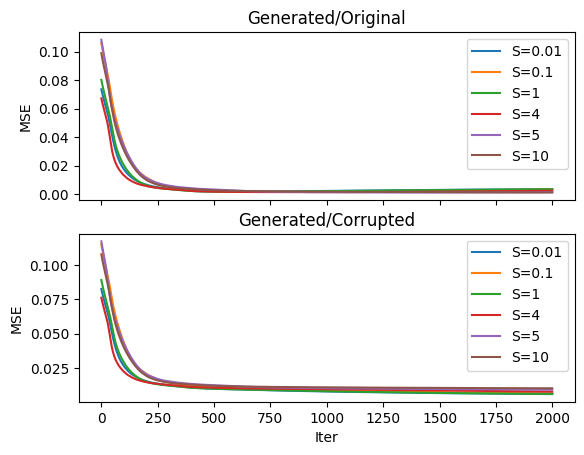

In [ ]:
fig = plt.figure(figsize=(20, 20))
fig, (ax1, ax2) = plt.subplots(2, 1,sharex=True)
for i,(orig_,corr_) in enumerate(zip(orig,corr)):
  ax1.plot(range(len(orig_)),orig_,label='S='+str(weight_noise[i]))
  ax2.plot(range(len(corr_)),corr_,label='S='+str(weight_noise[i]))
ax2.set_xlabel('Iter')
ax1.set_ylabel('MSE')
ax2.set_ylabel('MSE')
ax1.set_title('Generated/Original')
ax2.set_title('Generated/Corrupted')
ax1.legend()
ax2.legend()
plt.show()


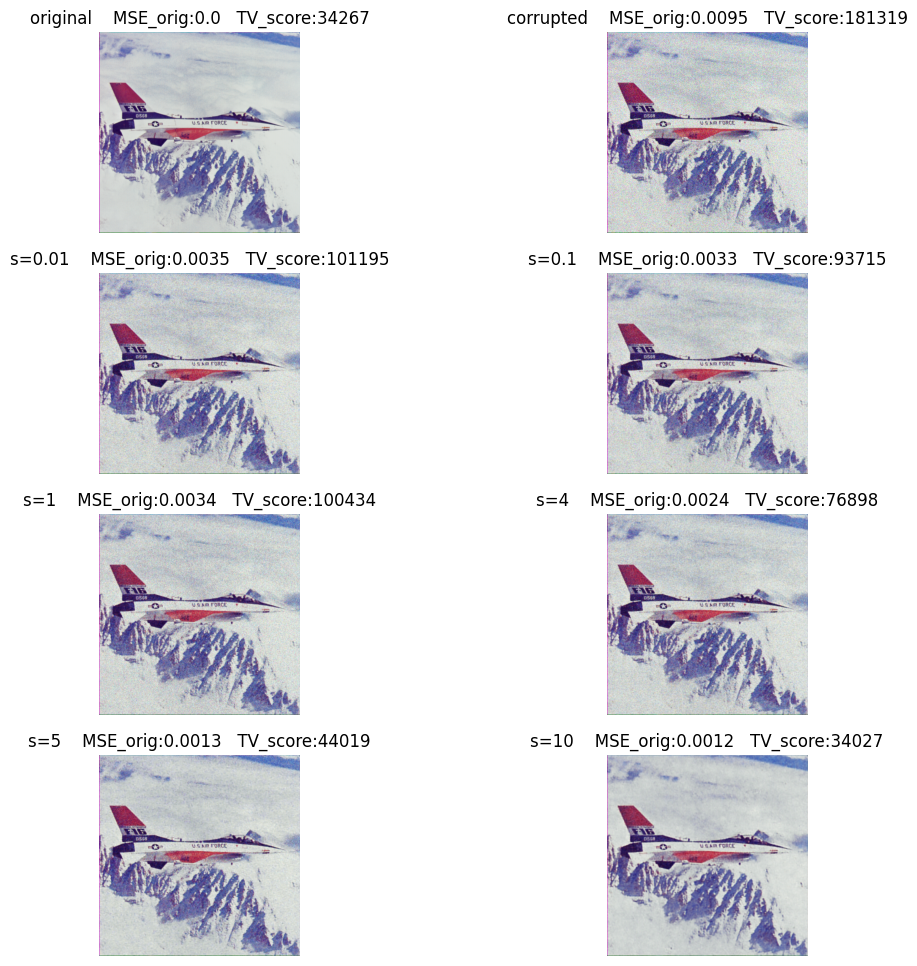

In [ ]:
from torchmetrics import TotalVariation

fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(12,12))
TV= TotalVariation().to('cuda')
MSE = torch.nn.MSELoss().to('cuda')
labels = ['original','corrupted']+['s='+str(i) for i in weight_noise]
for title,pic,ax in zip(labels,output_sgld,ax.flat):
  ax.imshow(pic[0].cpu().detach().numpy().transpose((1, 2, 0)))
  ax.set_title(f'{title}    MSE_orig:{round(float(MSE(pic,img)),4)}   TV_score:{int(TV(pic))}')
  ax.set_axis_off()

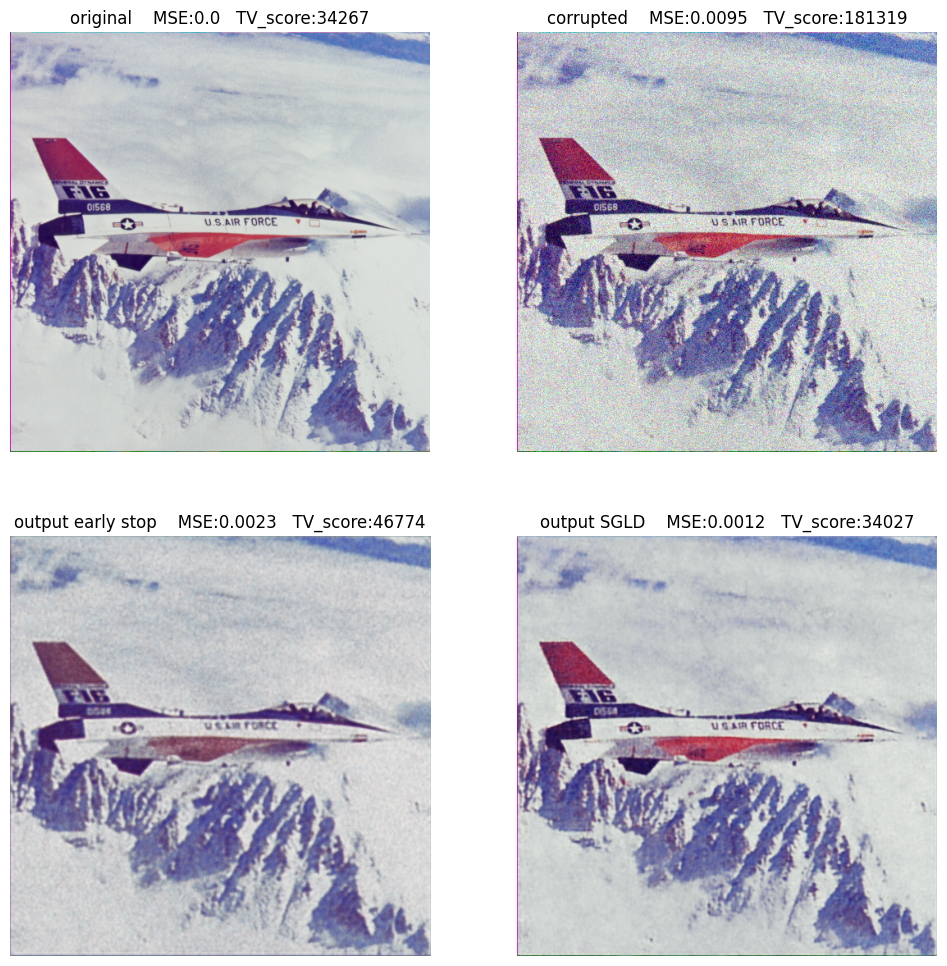

In [ ]:
sgld_pic = output_sgld[7] #best sgld_pic
tv_pic = output_TV
labels = ['original','corrupted','output early stop','output SGLD']
pics = [img,corrupted_img,tv_pic,sgld_pic]

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,12))
TV= TotalVariation().to('cuda')
MSE = torch.nn.MSELoss().to('cuda')
for title,pic,ax in zip(labels,pics,ax.flat):
  ax.imshow(pic[0].cpu().detach().numpy().transpose((1, 2, 0)))
  ax.set_title(f'{title}    MSE:{round(float(MSE(pic,img)),4)}   TV_score:{int(TV(pic))}')
  ax.set_axis_off()

SGLD method gives better result than TV, but TV early stopping works faster. Also, it's interesting that result value for TV loss which we obtaing by SGLD is smaller than for original picture

## Inpainting

Deep Image Prior is a versatile tool that can be utilized in solving an important task such as image inpainting. In this task, the challenge lies in the inability to obtain values for the pixels that are damaged and defined by the mask. Thus, during the training process, it is essential to apply the mask to the generated image as these values are unavailable for this particular task. Furthermore, in order to effectively address this issue, you will try a more complex model called AttentionUNet. This model is similar to the UNet model in terms of structure but with the inclusion of attention blocks in the decoder part.

### Attention block (10 pts)

For AttentionUNet implementation you only need to implement Attention layer. Attention should scale hidden output of encoder block which is also an input for the corresponding decoder block in order to draw more "attention" to particular image parts. Below we have placed the pipeline which you should implement:

**Input:** $skip$ of size [batch,skip_channels,H_skip,W_skip], $x$ of size [batch,x_channels,H_x,W_x]

**Output:** $skip^*$ of size [batch,skip_channels,H_skip,W_skip]

1. Apply 2d convolution with kernel size $2$ to $skip$ to make it of size [batch,skip_channels,H_x,W_x] (recall that 2H_x = H_skip, 2W_x = W_skip)
2. Apply 2d convolution with kernel size $1$ to $x$ to make it of size [batch,skip_channels,H_x,W_x]
3. Sum the outputs of previous two steps and apply ReLU over it.
4. Apply 2d convolution to previous output to reduce channel dimension to 1. So the output should have size equal [batch,1,H_x,W_x]
5. Apply Sigmoid to the previous output to get attention itself
6. Apply attention to the input $skip$ (original block input **NOT** the output of the first step) by simply multipling $skip$ by attention element-wise.

In [ ]:
class Attention(torch.nn.Module):
    def __init__(self,skip_channels, x_channels):
        super().__init__()
        self.First = torch.nn.Conv2d(skip_channels, skip_channels,kernel_size=2, stride=2)

        self.Second = torch.nn.Conv2d(x_channels, skip_channels,kernel_size=1)
        self.Relu = torch.nn.ReLU()
        self.Third = torch.nn.Conv2d(skip_channels, 1,kernel_size=1)
        self.Sigm = torch.nn.Sigmoid()

    def forward(self,skip,x):
        Conv1 = self.First(skip)
        Conv2 = self.Second(x)
        ReLu = self.Relu(Conv1+Conv2)
        Conv3 = self.Third(ReLu)
        attention = self.Sigm(Conv3)
        attention = torch.nn.functional.interpolate(attention, size=skip.size()[2:], mode='bilinear', align_corners=False)
        attention = attention.expand(skip.size())
        output = skip*attention
        return output

In [ ]:
class Decoder_Block_With_Attention(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.attention = Attention(out_channels,inp_channels)
    def forward(self,x,enc_x):
        enc_x = self.attention(enc_x,x)
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)


class AttentionUnet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block_With_Attention(hidden_size*16,hidden_size*8),
            Decoder_Block_With_Attention(hidden_size*8,hidden_size*4),
            Decoder_Block_With_Attention(hidden_size*4,hidden_size*2),
            Decoder_Block_With_Attention(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [ ]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

In [ ]:
img = transform(Image.open("./data/inpainting/library.png"))[None].to(device)
img_mask = transform(Image.open("./data/inpainting/library_mask.png"))[None].to(device)
corrupted_img = img * img_mask

In [ ]:
img_mask.shape

torch.Size([1, 1, 256, 256])

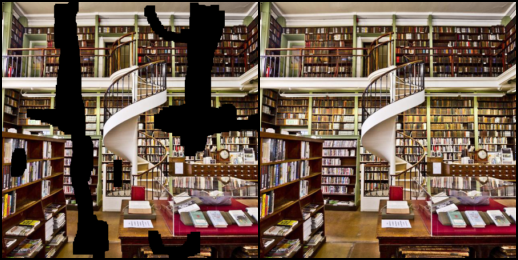

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

### Modify SGLD optimization (6 pts):
1. Take the code for SGLD and update loss calculation by applying mask to generated image (take $s$ = 4, lr = $4 \cdot 10^{-4}$, reg_noise = $0.2$, iters=$2000$)
2. Run the code and evaluate how well model fitted to known pixels and restore the missed one
3. Run the same code with standard UNet model and compare results with AttentionUNet. What conclusion can you make?


**Bonus task (4 pts)** Try to find optimal hyper parameters (strength of added noise $s$, learning rate, reg_noise, number of iterations)

To check difference between evaluating of known and unknow pixels I will compare MSE(corrupted,output) - for known pixels
MSE(original_mask_invetred,output_mask_inverted)
Mask_inverted - original mask where 0 swapped on 1, and 1 swapped on 0
original_mask_inverted - multiplication of original with inverted mask

In [ ]:
MSE=torch.nn.MSELoss().to('cuda')
def pic_mask_invert(pic,mask):
  return pic*(1- mask)

def MSE_inpaint(pic,output,mask):
  unknown_output = pic_mask_invert(output,mask)
  unknown_orig = pic_mask_invert(pic,mask)
  return MSE(output*mask,pic*mask),MSE(unknown_output,unknown_orig)

def optimization_inpainting(model,z,corrupted_img,mask,orig_img,iters=2000,criterion=torch.nn.MSELoss(),reg_noise=0.3,s=4,lr=4*10**(-4)):
    from torchmetrics import TotalVariation

    opt = torch.optim.Adam(model.parameters(),lr=lr)
    loss_corrupted = []
    loss_orig = []
    output_prev = 0

    model = model.cuda()
    z = z.cuda()
    orig_img = orig_img.cuda()
    corrupted_img = corrupted_img.cuda()
    mask = mask.cuda()
    MSE_known = []
    MSE_unknown = []
    for i in tqdm(range(iters)):
      if i%500 == 0 and i//500>1:
        torch.cuda.empty_cache()
        gc.collect()

      model.train(True)
      m = (z+torch.rand_like(z)*reg_noise)
      output = model(m)


      loss = criterion(output*img_mask, corrupted_img)

      output_prev = output
      loss_orig.append(criterion(output*img_mask, orig_img*img_mask).item())
      loss_corrupted.append(loss.item())
      opt.zero_grad()
      loss.backward()
      opt.step()
      for name, param in model.named_parameters():
        name = name.split('.')
        n = torch.randn(param.size(),dtype=torch.float32)*lr*s
        n=n.to('cuda')
        if name[-1]=='weight':
          if name[0] in ('Encoder','Decoder','bottleneck'):
            if name[1] in ['0','3']:
              param.data = param.data + n
          if name[0]=='last_layer':
            if name[1]==['0']:
              param.data = param.data + n

      scores=MSE_inpaint(img,output,mask)
      MSE_known.append(scores[0].item())
      MSE_unknown.append(scores[1].item())
      if i%100 == 0 and i//100 > 1:
        print(f'MSE_known: {scores[0].item()},MSE_uknonw: {scores[1].item()}')
    return MSE_known, MSE_unknown, output_prev

In [ ]:
nc = 2
model_without_attention = Unet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

In [ ]:
mse_known, mse_unknown, output_inp = optimization_inpainting(model=model_without_attention,z=z,mask=img_mask,corrupted_img=corrupted_img,orig_img=img)

 10%|█         | 206/2000 [00:06<00:53, 33.67it/s]

MSE_known: 0.0065888771787285805,MSE_uknonw: 0.007679486181586981


 15%|█▌        | 304/2000 [00:09<01:15, 22.37it/s]

MSE_known: 0.0045942822471261024,MSE_uknonw: 0.007336406968533993


 20%|██        | 405/2000 [00:13<00:47, 33.55it/s]

MSE_known: 0.0036106116604059935,MSE_uknonw: 0.0072324518114328384


 25%|██▌       | 505/2000 [00:16<00:45, 32.92it/s]

MSE_known: 0.0029594693332910538,MSE_uknonw: 0.007180802058428526


 30%|███       | 605/2000 [00:19<00:43, 32.34it/s]

MSE_known: 0.0024990462698042393,MSE_uknonw: 0.007396488916128874


 35%|███▌      | 705/2000 [00:24<00:46, 28.15it/s]

MSE_known: 0.002123258076608181,MSE_uknonw: 0.007138387765735388


 40%|████      | 806/2000 [00:27<00:37, 31.63it/s]

MSE_known: 0.001849466236308217,MSE_uknonw: 0.006822771392762661


 45%|████▌     | 906/2000 [00:30<00:33, 32.68it/s]

MSE_known: 0.0016207214212045074,MSE_uknonw: 0.006769753992557526


 50%|█████     | 1005/2000 [00:34<01:26, 11.50it/s]

MSE_known: 0.0015131027903407812,MSE_uknonw: 0.006994687952101231


 55%|█████▌    | 1105/2000 [00:38<00:28, 30.86it/s]

MSE_known: 0.0013410462997853756,MSE_uknonw: 0.006800788454711437


 60%|██████    | 1205/2000 [00:41<00:25, 31.68it/s]

MSE_known: 0.0012084523914381862,MSE_uknonw: 0.006778045557439327


 65%|██████▌   | 1305/2000 [00:44<00:21, 32.45it/s]

MSE_known: 0.0011319111799821258,MSE_uknonw: 0.00677469139918685


 70%|███████   | 1405/2000 [00:49<00:27, 21.58it/s]

MSE_known: 0.0010319168213754892,MSE_uknonw: 0.006780653260648251


 75%|███████▌  | 1505/2000 [00:52<00:18, 26.21it/s]

MSE_known: 0.00100227992516011,MSE_uknonw: 0.006791824474930763


 80%|████████  | 1605/2000 [00:55<00:12, 32.63it/s]

MSE_known: 0.0009170779958367348,MSE_uknonw: 0.006872330792248249


 85%|████████▌ | 1705/2000 [00:59<00:09, 31.38it/s]

MSE_known: 0.0008889053715392947,MSE_uknonw: 0.006833337247371674


 90%|█████████ | 1804/2000 [01:03<00:08, 24.38it/s]

MSE_known: 0.0007969246944412589,MSE_uknonw: 0.006661138962954283


 95%|█████████▌| 1907/2000 [01:07<00:02, 33.58it/s]

MSE_known: 0.0007626593578606844,MSE_uknonw: 0.006640784442424774


100%|██████████| 2000/2000 [01:10<00:00, 28.36it/s]


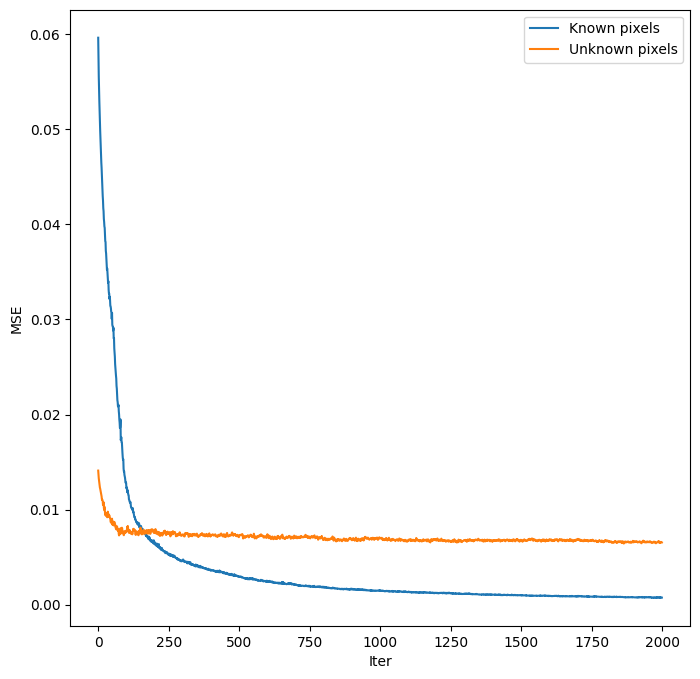

In [ ]:
fig = plt.figure(figsize=(8, 8))

plt.plot(range(len(mse_known)),mse_known,label='Known pixels')
plt.plot(range(len(mse_unknown)),mse_unknown,label='Unknown pixels')
plt.ylabel('MSE')
plt.xlabel('Iter')
plt.legend()
plt.show()

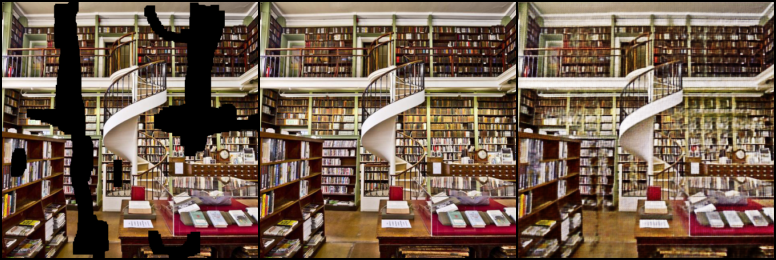

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,output_inp],dim=0),nrow=3,normalize=True))

In [ ]:
nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

In [ ]:
mse_known_at, mse_unknown_at, output_inp_at = optimization_inpainting(model=model_with_attention,z=z,mask=img_mask,corrupted_img=corrupted_img,orig_img=img)

 10%|█         | 205/2000 [00:08<01:07, 26.47it/s]

MSE_known: 0.005059964954853058,MSE_uknonw: 0.00963133480399847


 15%|█▌        | 304/2000 [00:12<01:03, 26.88it/s]

MSE_known: 0.003706518327817321,MSE_uknonw: 0.008923985995352268


 20%|██        | 406/2000 [00:17<01:13, 21.70it/s]

MSE_known: 0.0026610016357153654,MSE_uknonw: 0.008638124912977219


 25%|██▌       | 505/2000 [00:20<00:54, 27.43it/s]

MSE_known: 0.00211135670542717,MSE_uknonw: 0.008772432804107666


 30%|███       | 604/2000 [00:24<00:52, 26.62it/s]

MSE_known: 0.0018514792900532484,MSE_uknonw: 0.008312378078699112


 35%|███▌      | 703/2000 [00:30<01:25, 15.25it/s]

MSE_known: 0.0015467568300664425,MSE_uknonw: 0.007967740297317505


 40%|████      | 805/2000 [00:35<00:56, 21.34it/s]

MSE_known: 0.001420979155227542,MSE_uknonw: 0.008001169189810753


 45%|████▌     | 903/2000 [00:42<01:26, 12.62it/s]

MSE_known: 0.0013328957138583064,MSE_uknonw: 0.008134735748171806


 50%|█████     | 1006/2000 [00:52<01:05, 15.13it/s]

MSE_known: 0.0011913502821698785,MSE_uknonw: 0.007969275116920471


 55%|█████▌    | 1105/2000 [00:59<00:35, 24.97it/s]

MSE_known: 0.0010491361608728766,MSE_uknonw: 0.007676198147237301


 60%|██████    | 1203/2000 [01:05<00:38, 20.66it/s]

MSE_known: 0.000994258327409625,MSE_uknonw: 0.007883050478994846


 65%|██████▌   | 1303/2000 [01:12<00:30, 23.16it/s]

MSE_known: 0.0008917301893234253,MSE_uknonw: 0.007627052720636129


 70%|███████   | 1402/2000 [01:17<00:31, 18.91it/s]

MSE_known: 0.0009193881414830685,MSE_uknonw: 0.007943332195281982


 75%|███████▌  | 1503/2000 [01:24<00:39, 12.70it/s]

MSE_known: 0.0008110992494039237,MSE_uknonw: 0.00802276935428381


 80%|████████  | 1606/2000 [01:29<00:16, 24.46it/s]

MSE_known: 0.0007748177158646286,MSE_uknonw: 0.007621643599122763


 85%|████████▌ | 1703/2000 [01:35<00:15, 19.71it/s]

MSE_known: 0.0007272640941664577,MSE_uknonw: 0.007492273114621639


 90%|█████████ | 1805/2000 [01:39<00:07, 26.88it/s]

MSE_known: 0.000682157464325428,MSE_uknonw: 0.007474775426089764


 95%|█████████▌| 1904/2000 [01:43<00:03, 27.53it/s]

MSE_known: 0.000669809989631176,MSE_uknonw: 0.007489937357604504


100%|██████████| 2000/2000 [01:47<00:00, 18.53it/s]


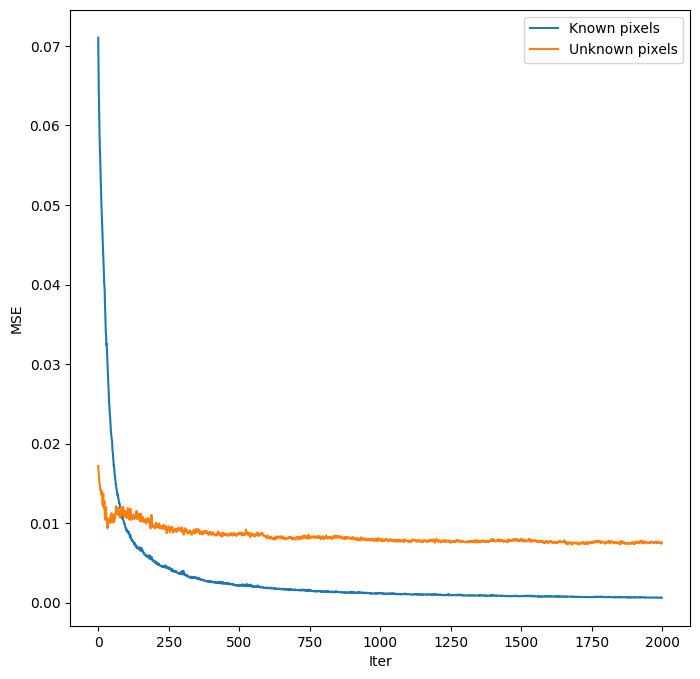

In [ ]:
fig = plt.figure(figsize=(8, 8))

plt.plot(range(len(mse_known_at)),mse_known_at,label='Known pixels')
plt.plot(range(len(mse_unknown_at)),mse_unknown_at,label='Unknown pixels')
plt.ylabel('MSE')
plt.xlabel('Iter')
plt.legend()
plt.show()

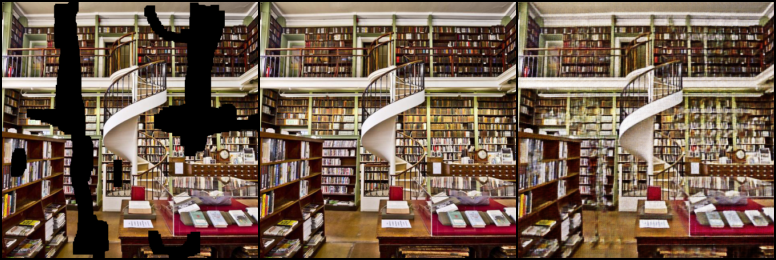

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,output_inp_at],dim=0),nrow=3,normalize=True))

In [ ]:
print('RESULT')
print(f'Attention model, known pixels: {mse_known_at[-1]}, unknown_pixels: {mse_unknown_at[-1]}')
print(f'No attention model, known pixels: {mse_known[-1]}, unknown_pixels: {mse_unknown[-1]}')

RESULT
Attention model, known pixels: 0.0006113102426752448, unknown_pixels: 0.007296857889741659
No attention model, known pixels: 0.0007213220815174282, unknown_pixels: 0.006423306651413441


Attention model performs better for task of inpainting, but for known pixels gives worse results (from pic of MSE we can see that loss stil decreasing, mb on more iters it will perform better)

In [ ]:
MSE=torch.nn.MSELoss().to('cuda')
def pic_mask_invert(pic,mask):
  return pic*(1- mask)

def MSE_inpaint(pic,output,mask):
  unknown_output = pic_mask_invert(output,mask)
  unknown_orig = pic_mask_invert(pic,mask)
  return MSE(output*mask,pic*mask),MSE(unknown_output,unknown_orig)

def optimization_inpainting_(model,z,corrupted_img,mask,orig_img,iters=2000,criterion=torch.nn.MSELoss(),reg_noise=0.3,s=4,lr=4*10**(-4)):
    from torchmetrics import TotalVariation

    opt = torch.optim.Adam(model.parameters(),lr=lr)
    loss_corrupted = []
    loss_orig = []
    output_prev = 0

    model = model.cuda()
    z = z.cuda()
    orig_img = orig_img.cuda()
    corrupted_img = corrupted_img.cuda()
    mask = mask.cuda()
    MSE_known = []
    MSE_unknown = []
    for i in range(iters):
      if i%500 == 0 and i//500>1:
        torch.cuda.empty_cache()
        gc.collect()

      model.train(True)
      m = (z+torch.rand_like(z)*reg_noise)
      output = model(m)


      loss = criterion(output*img_mask, corrupted_img)

      output_prev = output
      loss_orig.append(criterion(output*img_mask, orig_img*img_mask).item())
      loss_corrupted.append(loss.item())
      opt.zero_grad()
      loss.backward()
      opt.step()
      for name, param in model.named_parameters():
        name = name.split('.')
        n = torch.randn(param.size(),dtype=torch.float32)*lr*s
        n=n.to('cuda')
        if name[-1]=='weight':
          if name[0] in ('Encoder','Decoder','bottleneck'):
            if name[1] in ['0','3']:
              param.data = param.data + n
          if name[0]=='last_layer':
            if name[1]==['0']:
              param.data = param.data + n

      scores=MSE_inpaint(img,output,mask)
      MSE_known.append(scores[0].item())
      MSE_unknown.append(scores[1].item())

    return MSE_known, MSE_unknown, output_prev

In [ ]:
import itertools
grid= {'s':[1,4,10],
          'lr':[10**(-4),4*10**(-4),10**(-3)],
          'reg_noise':[0.01,0.1,0.3],
          'iter':[1000,2000,3000]}

mask = img_mask
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)
result_score = []
grid_=[]
for params in itertools.product(*grid.values()):
  grid_.append(params)
for params in tqdm(grid_):
  s = params[0]
  lr = params[1]
  reg_noise = params[2]
  iter = params[3]
  _, _, output = optimization_inpainting_(model=model_with_attention,z=z,mask=img_mask,corrupted_img=corrupted_img,orig_img=img,lr=lr,s=s,reg_noise=reg_noise,iters=iter)
  result = MSE_inpaint(img,output,mask)[1].item()
  result_score.append(result)
  print('--------'*20)
  print('iter=',iter,' s=',s,' lr=',lr,' reg_noise=',reg_noise)
  print('MSE_unknown_pixels: ',result)

  1%|          | 1/81 [00:38<51:05, 38.32s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.01379508525133133


  2%|▏         | 2/81 [01:55<1:20:20, 61.02s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.011841671541333199


  4%|▎         | 3/81 [03:49<1:51:03, 85.43s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.010918739251792431


  5%|▍         | 4/81 [04:28<1:25:47, 66.85s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.010357643477618694


  6%|▌         | 5/81 [05:44<1:29:08, 70.38s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.010127060115337372


  7%|▋         | 6/81 [07:39<1:46:48, 85.44s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.00985642895102501


  9%|▊         | 7/81 [08:17<1:26:24, 70.05s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.00974978506565094


 10%|▉         | 8/81 [09:34<1:27:47, 72.16s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.009458055719733238


 11%|█         | 9/81 [11:29<1:42:48, 85.68s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.009470044635236263


 12%|█▏        | 10/81 [12:08<1:24:02, 71.02s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.008898495696485043


 14%|█▎        | 11/81 [13:25<1:25:10, 73.00s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.008250495418906212


 15%|█▍        | 12/81 [15:21<1:38:59, 86.08s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.007958061061799526


 16%|█▌        | 13/81 [15:59<1:21:08, 71.60s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.007949032820761204


 17%|█▋        | 14/81 [17:16<1:21:34, 73.06s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.007675075903534889


 19%|█▊        | 15/81 [19:11<1:34:24, 85.83s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.007592499256134033


 20%|█▉        | 16/81 [19:49<1:17:23, 71.43s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.0075702606700360775


 21%|██        | 17/81 [21:05<1:17:43, 72.87s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.007488457020372152


 22%|██▏       | 18/81 [23:15<1:34:34, 90.07s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.007530439645051956


 23%|██▎       | 19/81 [23:54<1:17:04, 74.59s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.007265099789947271


 25%|██▍       | 20/81 [25:11<1:16:39, 75.39s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.0067076957784593105


 26%|██▌       | 21/81 [27:06<1:27:04, 87.07s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.006616923958063126


 27%|██▋       | 22/81 [27:44<1:11:07, 72.34s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.00662528071552515


 28%|██▊       | 23/81 [28:59<1:10:58, 73.42s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.006655778270214796


 30%|██▉       | 24/81 [30:54<1:21:30, 85.79s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.006756428629159927


 31%|███       | 25/81 [31:32<1:06:43, 71.49s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 1  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.006702559068799019


 32%|███▏      | 26/81 [32:48<1:06:45, 72.82s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 1  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.006551426835358143


 33%|███▎      | 27/81 [34:42<1:16:37, 85.13s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 1  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.006565879564732313


 35%|███▍      | 28/81 [35:20<1:02:39, 70.93s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.0067040021531283855


 36%|███▌      | 29/81 [36:36<1:02:47, 72.45s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.006743296515196562


 37%|███▋      | 30/81 [38:29<1:12:01, 84.74s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.006772495340555906


 38%|███▊      | 31/81 [39:07<58:51, 70.63s/it]  

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.006757467519491911


 40%|███▉      | 32/81 [40:23<58:54, 72.13s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.006761331111192703


 41%|████      | 33/81 [42:17<1:07:45, 84.70s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.006697036325931549


 42%|████▏     | 34/81 [42:54<55:17, 70.58s/it]  

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.006665804889053106


 43%|████▎     | 35/81 [44:11<55:25, 72.30s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.00671375822275877


 44%|████▍     | 36/81 [46:04<1:03:35, 84.78s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.006657509133219719


 46%|████▌     | 37/81 [46:42<51:45, 70.59s/it]  

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.006676164921373129


 47%|████▋     | 38/81 [47:58<51:41, 72.13s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.006621816661208868


 48%|████▊     | 39/81 [49:51<59:06, 84.44s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.006498945876955986


 49%|████▉     | 40/81 [50:28<48:05, 70.37s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.00649840384721756


 51%|█████     | 41/81 [51:44<48:00, 72.00s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.0064802407287061214


 52%|█████▏    | 42/81 [53:37<54:50, 84.36s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.0067034559324383736


 53%|█████▎    | 43/81 [54:15<44:34, 70.39s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.006587307900190353


 54%|█████▍    | 44/81 [55:36<45:17, 73.44s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.006582422181963921


 56%|█████▌    | 45/81 [57:33<52:00, 86.68s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.006549458019435406


 57%|█████▋    | 46/81 [58:11<42:00, 72.01s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.006336843129247427


 58%|█████▊    | 47/81 [59:27<41:24, 73.06s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.006333404220640659


 59%|█████▉    | 48/81 [1:01:20<46:48, 85.10s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.006228930316865444


 60%|██████    | 49/81 [1:01:57<37:46, 70.83s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.0061186826787889


 62%|██████▏   | 50/81 [1:03:13<37:18, 72.21s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.0061902841553092


 63%|██████▎   | 51/81 [1:05:06<42:14, 84.50s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.006141796708106995


 64%|██████▍   | 52/81 [1:05:43<34:00, 70.36s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 4  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.006078427191823721


 65%|██████▌   | 53/81 [1:06:59<33:30, 71.82s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 4  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.005987289361655712


 67%|██████▋   | 54/81 [1:08:52<37:52, 84.18s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 4  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.005981171503663063


 68%|██████▊   | 55/81 [1:09:29<30:25, 70.20s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.0060548437759280205


 69%|██████▉   | 56/81 [1:10:44<29:52, 71.71s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.006171343848109245


 70%|███████   | 57/81 [1:12:38<33:46, 84.43s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.0001  reg_noise= 0.01
MSE_unknown_pixels:  0.006177864503115416


 72%|███████▏  | 58/81 [1:13:16<26:59, 70.39s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.006194998510181904


 73%|███████▎  | 59/81 [1:14:33<26:28, 72.20s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.006167784333229065


 74%|███████▍  | 60/81 [1:16:26<29:35, 84.56s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.0001  reg_noise= 0.1
MSE_unknown_pixels:  0.006161139812320471


 75%|███████▌  | 61/81 [1:17:04<23:32, 70.65s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.006136853247880936


 77%|███████▋  | 62/81 [1:18:20<22:50, 72.13s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.006059623789042234


 78%|███████▊  | 63/81 [1:20:14<25:25, 84.74s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.0001  reg_noise= 0.3
MSE_unknown_pixels:  0.006038643419742584


 79%|███████▉  | 64/81 [1:20:52<20:01, 70.66s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.006164876744151115


 80%|████████  | 65/81 [1:22:08<19:17, 72.33s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.006061188410967588


 81%|████████▏ | 66/81 [1:24:02<21:14, 84.99s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.0004  reg_noise= 0.01
MSE_unknown_pixels:  0.006013486534357071


 83%|████████▎ | 67/81 [1:24:40<16:31, 70.80s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.005974777042865753


 84%|████████▍ | 68/81 [1:25:56<15:40, 72.38s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.00587354926392436


 85%|████████▌ | 69/81 [1:27:51<17:01, 85.10s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.0004  reg_noise= 0.1
MSE_unknown_pixels:  0.0058657331392169


 86%|████████▋ | 70/81 [1:28:29<13:00, 70.91s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.005845698527991772


 88%|████████▊ | 71/81 [1:29:45<12:03, 72.39s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.005789906717836857


 89%|████████▉ | 72/81 [1:31:39<12:44, 84.93s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.0004  reg_noise= 0.3
MSE_unknown_pixels:  0.005686587654054165


 90%|█████████ | 73/81 [1:32:17<09:27, 70.90s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.005941334646195173


 91%|█████████▏| 74/81 [1:33:33<08:27, 72.56s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.006038004066795111


 93%|█████████▎| 75/81 [1:35:27<08:29, 84.91s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.001  reg_noise= 0.01
MSE_unknown_pixels:  0.005942546762526035


 94%|█████████▍| 76/81 [1:36:05<05:53, 70.72s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.005922929849475622


 95%|█████████▌| 77/81 [1:37:20<04:48, 72.13s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.005769070237874985


 96%|█████████▋| 78/81 [1:39:15<04:14, 84.81s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.001  reg_noise= 0.1
MSE_unknown_pixels:  0.005789249669760466


 98%|█████████▊| 79/81 [1:39:53<02:21, 70.78s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 1000  s= 10  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.005648835562169552


 99%|█████████▉| 80/81 [1:41:09<01:12, 72.36s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 2000  s= 10  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.0057732779532670975


100%|██████████| 81/81 [1:43:34<00:00, 76.72s/it]

----------------------------------------------------------------------------------------------------------------------------------------------------------------
iter= 3000  s= 10  lr= 0.001  reg_noise= 0.3
MSE_unknown_pixels:  0.005804724991321564


In [ ]:
def get_best_params(dict_,grid,result):
  result = np.array(result)
  idx = np.argmin(result)
  result_best = result[idx]
  labels = dict_.keys()
  print('Best parameters')
  for i,j in zip(labels,grid[idx]):
    print(f'{i}={j} ',end="")
  print()
  print(f'Result MSE for inpainting part:{result_best}')
get_best_params(grid,grid_,result_score)


Best parameters
s=10 lr=0.001 reg_noise=0.3 iter=1000 
Result MSE for inpainting part:0.005648835562169552
